In [1]:
import os

def print_tree(path, prefix="", max_files=3):
    entries = sorted(os.listdir(path))
    files = [e for e in entries if os.path.isfile(os.path.join(path, e))]
    dirs = [
        e for e in entries
        if os.path.isdir(os.path.join(path, e)) and e != '.ipynb_checkpoints'
    ]
    
    # 폴더 출력
    print(prefix + os.path.basename(path) + "/")

    # 하위 디렉토리 출력
    for d in dirs:
        print_tree(os.path.join(path, d), prefix + "    ", max_files=max_files)
    
    # .jpg 파일 최대 3개까지만 출력
    jpgs = [f for f in files if f.lower().endswith('.jpg')]
    for f in jpgs[:max_files]:
        print(prefix + "    " + f)
    if len(jpgs) > max_files:
        print(prefix + "    ...")

# 사용 예시
print_tree("./dataset")

dataset/
    traffic_data/
        training/
            bbox_tr/
                annotations/
                image_bbox/
                    LG전자_부천랜드점_부근/
                        LG전자_부천랜드점_부근/
                            BC2000201/
                                20201014_015958_S_1089.jpg
                                20201014_015958_S_1287.jpg
                                20201014_015958_S_1386.jpg
                                ...
                    갑천교네거리/
                        갑천교네거리/
                            SC0041701/
                                20200907_020000_R_150.jpg
                                20200907_020000_R_300.jpg
                                20200907_020000_R_450.jpg
                                ...
                            SC0041702/
                                20200907_020000_R_10050.jpg
                                20200907_020000_R_10650.jpg
                                20200907_020000_R_11250.jpg
                       

In [85]:
import os
import json
import cv2
import matplotlib.pyplot as plt

# 경로
IMG_ROOT   = "./dataset/traffic_data/training/bbox_tr/image_bbox"  # 이미지 트리 최상단
LABEL_ROOT = "./dataset/traffic_data/training/bbox_tr/annotations"  # 라벨(JSON) 트리 최상단

In [86]:
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 깨짐 방지

In [87]:
# 라벨 병합
def merge_coco_trees(label_root):
    images, annotations, metas = [], [], []
    categories = None

    img_id_off = 0
    ann_id_off = 0

    for r, _, files in os.walk(label_root):
        for fn in files:
            if not fn.lower().endswith(".json"):
                continue
            p = os.path.join(r, fn)
            with open(p, "r", encoding="utf-8") as f:
                d = json.load(f)

            # categories는 첫 JSON 것으로 고정(다르면 맞춰서 정리 필요)
            if categories is None:
                categories = d.get("categories", [])

            # 이미지 id 재매핑(충돌 방지)
            id_map = {}
            for im in d.get("images", []):
                old = im["id"]
                new = old + img_id_off
                im = dict(im); im["id"] = new
                images.append(im)
                id_map[old] = new

            # 어노테이션 id/이미지 id 재매핑
            for a in d.get("annotations", []):
                a = dict(a)
                if isinstance(a.get("id"), int):
                    a["id"] = a["id"] + ann_id_off
                a["image_id"] = id_map.get(a["image_id"], a["image_id"] + img_id_off)
                annotations.append(a)

            metas.extend(d.get("meta", []))

            # offset 갱신
            if id_map:
                img_id_off = max(id_map.values()) + 1
            if annotations:
                ann_id_off = max((x.get("id", 0) for x in annotations)) + 1

    return {"images": images, "annotations": annotations, "categories": categories or [], "meta": metas}

data = merge_coco_trees(LABEL_ROOT)
imgs = {im["id"]: im["file_name"] for im in data["images"]}
cats = {c["id"]: c.get("name", str(c["id"])) for c in data["categories"]}

In [88]:
# 이미지 경로 해결(basename 인덱스)
_basename2path = None
def _build_index(root):
    m = {}
    for r, _, files in os.walk(root):
        for fn in files:
            if fn.lower().endswith((".jpg",".jpeg",".png")):
                m.setdefault(fn, os.path.join(r, fn))
    return m

def resolve_img_path(file_name):
    global _basename2path
    p = os.path.join(IMG_ROOT, file_name)
    if os.path.exists(p):
        return p
    if _basename2path is None:
        _basename2path = _build_index(IMG_ROOT)
    return _basename2path.get(os.path.basename(file_name))

In [89]:
# bbox 유틸
def to_xyxy(b):
    x1, y1, a, d = b
    if a > x1 and d > y1:         # [x1,y1,x2,y2]
        return int(x1), int(y1), int(a), int(d)
    return int(x1), int(y1), int(x1 + a), int(y1 + d)  # [x,y,w,h]

findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.
findfont: Font family 'NanumGothic' not found.


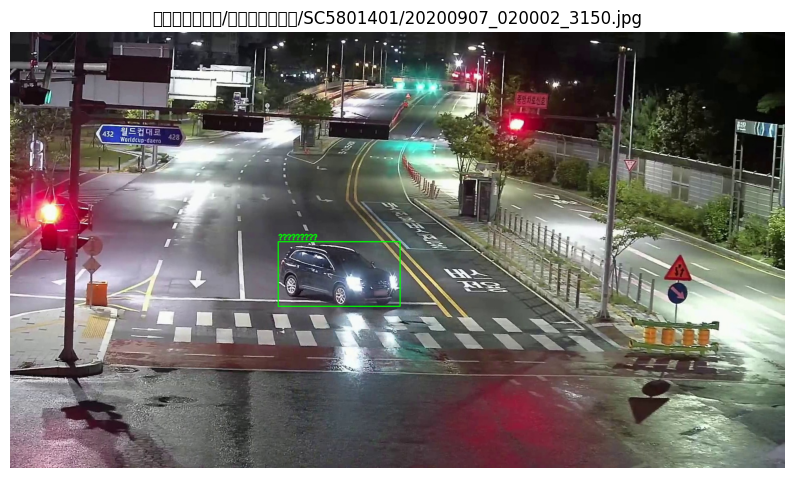

In [90]:
# 시각화
def show_bbox(idx=0):
    ann = data["annotations"][idx]
    file_name = imgs[ann["image_id"]]
    img_path = resolve_img_path(file_name)
    if not img_path:
        raise FileNotFoundError(f"이미지 못찾음: {file_name} (root={IMG_ROOT})")

    img = cv2.imread(img_path)
    if img is None:
        raise RuntimeError(f"이미지 로드 실패: {img_path}")

    bb = ann.get("bbox", [])
    cc = ann.get("category_id", [])
    pairs = zip(bb, cc) if (bb and isinstance(bb[0], list)) else [(bb, cc)]

    for b, cid in pairs:
        x1,y1,x2,y2 = to_xyxy(b)
        cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.putText(img, cats.get(cid, str(cid)), (x1, max(0, y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(os.path.relpath(img_path, IMG_ROOT))
    plt.axis("off"); plt.show()

# 예시
show_bbox(14)

In [85]:
import os, json

LABEL_ROOT = "dataset/traffic_data/training/bbox_tr/label_bbox"

weathers = set()
count = 0

for root, _, files in os.walk(LABEL_ROOT):
    for fn in files:
        if not fn.lower().endswith(".json"):
            continue
        path = os.path.join(root, fn)
        try:
            with open(path, "r", encoding="utf-8") as f:
                d = json.load(f)
            for m in d.get("meta", []):
                w = str(m.get("weather") or "").strip()
                if w:
                    weathers.add(w)
            count += 1
        except Exception as e:
            print(f"오류 발생: {path}, {e}")

print(f"총 {count}개 파일에서 {len(weathers)}종류의 날씨 감지됨:\n")
for w in sorted(weathers):
    print(" -", w)

총 71개 파일에서 5종류의 날씨 감지됨:

 - Cloudy
 - Foggy
 - Rainy
 - Snow
 - Sunny


In [84]:
import os, json

LABEL_ROOT = "dataset/traffic_data/training/bbox_tr/label_bbox"

times = set()
count = 0

for root, _, files in os.walk(LABEL_ROOT):
    for fn in files:
        if not fn.lower().endswith(".json"):
            continue
        path = os.path.join(root, fn)
        try:
            with open(path, "r", encoding="utf-8") as f:
                d = json.load(f)
            for m in d.get("meta", []):
                t = str(m.get("time_space") or "").strip()
                if t:
                    times.add(t)
            count += 1
        except Exception as e:
            print(f"오류 발생: {path}, {e}")

print(f"총 {count}개 파일에서 {len(times)}종류의 시간이 감지됨:\n")
for t in sorted(times):
    print(" -", t)

총 71개 파일에서 4종류의 시간이 감지됨:

 - 낮
 - 새벽
 - 오전
 - 오후


In [93]:
import os, json, random
from pathlib import Path

ROOT = Path("dataset/traffic_data")
DAY_JSON = ROOT / "training/bbox_tr/annotations/day_train.json"

with open(DAY_JSON, "r", encoding="utf-8") as f:
    d = json.load(f)

imgs = d["images"]
random.shuffle(imgs)
sample = imgs[:20]
ok = 0
for im in sample:
    p = ROOT / im["file_name"]
    if p.exists():
        ok += 1
    else:
        print("not found:", p)
print(f"존재 확인: {ok}/{len(sample)}")


존재 확인: 20/20


In [2]:
import os

def count_images(root_dir):
    image_count = 0
    for dirpath, dirnames, filenames in os.walk(root_dir):
        image_count += sum(1 for f in filenames if f.lower().endswith('.jpg'))
    return image_count

if __name__ == "__main__":
    root_path = "dataset/traffic_data/training/bbox_tr/image_bbox"
    total_images = count_images(root_path)
    print(f"총 이미지 개수: {total_images}")


총 이미지 개수: 145695


In [2]:
from pathlib import Path
import json
from typing import Any, Dict, List, Optional
from collections import Counter

# 올바른 경로: label_bbox 아래 각 지점 폴더에 JSON 존재
ANNOTATIONS_DIR: Path = Path("dataset/traffic_data/validation/bbox_val/label_bbox")

weather_cnt: Counter = Counter()
time_cnt: Counter = Counter()
missing_meta_images: int = 0
total_images: int = 0
bad_json_files: int = 0
images_without_meta_field: int = 0

# label_bbox 하위 모든 JSON 파일 탐색
json_files: List[Path] = sorted(ANNOTATIONS_DIR.rglob("*.json"))

for jp in json_files:
    try:
        with open(jp, "r", encoding="utf-8") as f:
            coco_any: Any = json.load(f)
    except Exception:
        bad_json_files += 1
        continue

    # meta 딕셔너리 구성
    meta_list_any: Any = coco_any.get("meta", [])
    meta_list: List[Dict[str, Any]] = list(meta_list_any) if isinstance(meta_list_any, list) else []
    meta_by_id: Dict[int, Dict[str, Any]] = {}
    for m in meta_list:
        try:
            mid = int(m.get("id", -1))
            meta_by_id[mid] = m
        except Exception:
            continue

    # images 순회
    images_any: Any = coco_any.get("images", [])
    images: List[Dict[str, Any]] = list(images_any) if isinstance(images_any, list) else []
    for img in images:
        total_images += 1
        mid_raw: Optional[Any] = img.get("meta_id", None)
        if mid_raw is None:
            images_without_meta_field += 1
            continue

        try:
            mid_int = int(mid_raw)
        except Exception:
            missing_meta_images += 1
            continue

        meta = meta_by_id.get(mid_int)
        if not meta:
            missing_meta_images += 1
            continue

        wv = str(meta.get("weather", "")).strip()
        tv = str(meta.get("time_space", "")).strip()

        weather_cnt[wv] += 1
        time_cnt[tv] += 1

print(f"총 JSON 파일 수: {len(json_files)}")
print(f"파싱 실패 JSON 파일 수: {bad_json_files}")
print(f"총 이미지 수: {total_images}")
print(f"images에서 meta_id 키 자체가 없는 이미지 수: {images_without_meta_field}")
print(f"meta 누락 또는 매칭 실패 이미지 수: {missing_meta_images}")
print("\nweather 분포(상위 50):", weather_cnt.most_common(50))
print("\ntime_space 분포(상위 50):", time_cnt.most_common(50))


총 JSON 파일 수: 46
파싱 실패 JSON 파일 수: 0
총 이미지 수: 18435
images에서 meta_id 키 자체가 없는 이미지 수: 0
meta 누락 또는 매칭 실패 이미지 수: 0

weather 분포(상위 50): [('Sunny', 15112), ('Rainy', 2260), ('Cloudy', 897), ('Foggy', 166)]

time_space 분포(상위 50): [('오전', 6439), ('낮', 5326), ('오후', 5043), ('새벽', 1627)]


# 시각화 코드

In [5]:
import matplotlib
from matplotlib import font_manager, rcParams

rcParams["font.family"] = "NanumGothic"
rcParams["axes.unicode_minus"] = False 

In [6]:
# 시각화 유틸: 읽기
from pathlib import Path
from typing import List, Tuple, Optional, Dict, Any
import math
import random
import ast

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

def load_class_names(yaml_path: Path) -> List[str]:
    names: List[str] = []
    if not yaml_path.exists():
        return names
    text: str = yaml_path.read_text(encoding="utf-8")
    for line in text.splitlines():
        s: str = line.strip()
        if s.startswith("names:"):
            rhs: str = s.split(":", 1)[1].strip()
            try:
                parsed: Any = ast.literal_eval(rhs)
                if isinstance(parsed, list):
                    names = [str(x) for x in parsed]
            except Exception:
                names = []
            break
    return names

def yolo_to_xyxy(cxn: float, cyn: float, wn: float, hn: float, w: int, h: int) -> Tuple[int, int, int, int]:
    cx: float = cxn * float(w)
    cy: float = cyn * float(h)
    bw: float = wn * float(w)
    bh: float = hn * float(h)
    x1: float = cx - bw / 2.0
    y1: float = cy - bh / 2.0
    x2: float = cx + bw / 2.0
    y2: float = cy + bh / 2.0
    x1i: int = int(max(0, min(float(w - 1), x1)))
    y1i: int = int(max(0, min(float(h - 1), y1)))
    x2i: int = int(max(0, min(float(w - 1), x2)))
    y2i: int = int(max(0, min(float(h - 1), y2)))
    return x1i, y1i, x2i, y2i

def read_yolo_txt(txt_path: Path) -> List[Tuple[int, float, float, float, float]]:
    recs: List[Tuple[int, float, float, float, float]] = []
    for line in txt_path.read_text(encoding="utf-8").splitlines():
        line = line.strip()
        if not line:
            continue
        parts: List[str] = line.split()
        if len(parts) < 5:
            continue
        cls_id: int = int(float(parts[0]))
        cxn: float = float(parts[1])
        cyn: float = float(parts[2])
        wn: float = float(parts[3])
        hn: float = float(parts[4])
        recs.append((cls_id, cxn, cyn, wn, hn))
    return recs


In [7]:
# 샘플 수집
def collect_samples(stage: str, subset: str, out_root: Path, limit: int) -> List[Tuple[Path, Path]]:
    pairs: List[Tuple[Path, Path]] = []
    labels_root: Path = out_root / stage / subset / "labels"
    if not labels_root.exists():
        return pairs
    txt_list: List[Path] = sorted(labels_root.rglob("/*.txt" if labels_root.is_file() else "*.txt"))
    random.shuffle(txt_list)
    pick: List[Path] = txt_list[:limit]
    for p in pick:
        rel: Path = p.relative_to(labels_root).with_suffix(".jpg")
        img_path: Path = (out_root / stage / subset / "images") / rel
        if not img_path.exists():
            alt: Path = img_path.with_suffix(".png")
            if alt.exists():
                img_path = alt
            else:
                continue
        pairs.append((img_path, p))
    return pairs


In [8]:
# 시각화: matplotlib 패치로 굵게 표시
def visualize_samples(stage: str,
                      subset: str,
                      out_root: Path,
                      class_names: List[str],
                      max_samples: int = 8,
                      cols: int = 4) -> None:
    pairs: List[Tuple[Path, Path]] = collect_samples(stage, subset, out_root, max_samples)
    if len(pairs) == 0:
        print(f"No samples found for {stage} / {subset}")
        return

    n: int = len(pairs)
    cols_eff: int = max(1, min(cols, n))
    rows: int = int(math.ceil(n / float(cols_eff)))
    plt.figure(figsize=(4 * cols_eff, 3.5 * rows))

    i: int
    for i in range(0, n):
        img_path, txt_path = pairs[i]
        img: Image.Image = Image.open(img_path).convert("RGB")
        w: int = img.width
        h: int = img.height
        ax = plt.subplot(rows, cols_eff, i + 1)
        ax.imshow(img)

        recs: List[Tuple[int, float, float, float, float]] = read_yolo_txt(txt_path)
        r: Tuple[int, float, float, float, float]
        for r in recs:
            cls_id, cxn, cyn, wn, hn = r
            x1, y1, x2, y2 = yolo_to_xyxy(cxn, cyn, wn, hn, w, h)
            if (x2 - x1) < 2 or (y2 - y1) < 2:
                continue
            lw: int = max(2, int(min(w, h) * 0.003))  # 해상도 기반 두께
            rect = Rectangle((x1, y1), x2 - x1, y2 - y1,
                             fill=False, edgecolor="lime", linewidth=lw)
            ax.add_patch(rect)

            label: str = class_names[cls_id] if 0 <= cls_id < len(class_names) else str(cls_id)
            ax.text(x1, max(0, y1 - 3),
                    label,
                    fontsize=8,
                    color="black",
                    bbox=dict(facecolor="yellow", alpha=0.6, edgecolor="none", pad=1.5))

        ax.set_title(f"{stage}/{subset}\n{img_path.name}", fontsize=9)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


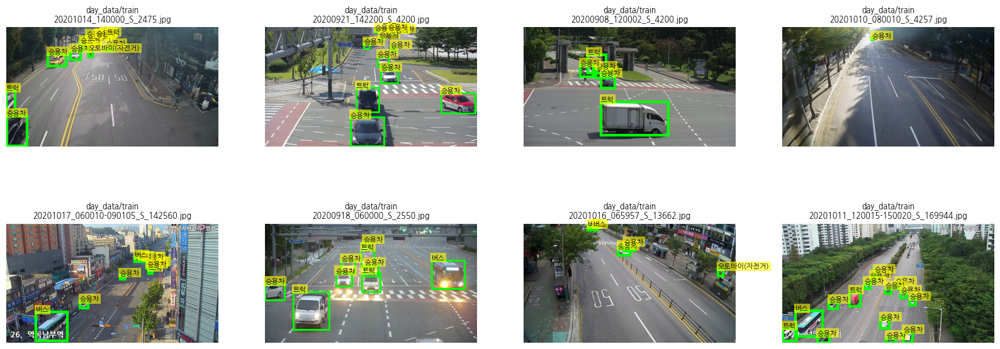

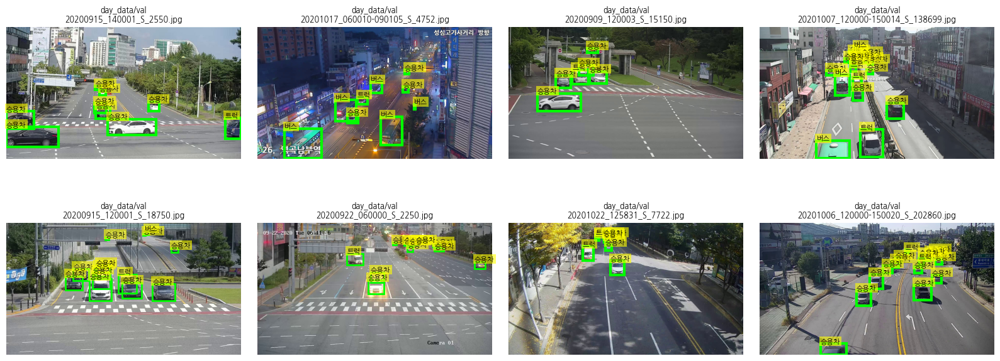

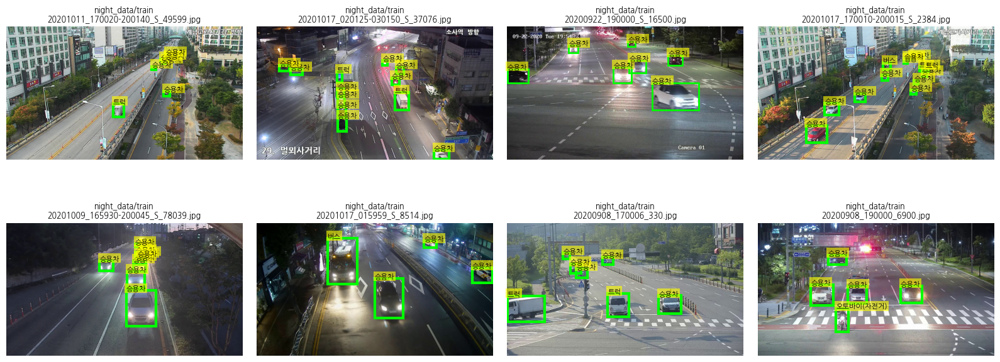

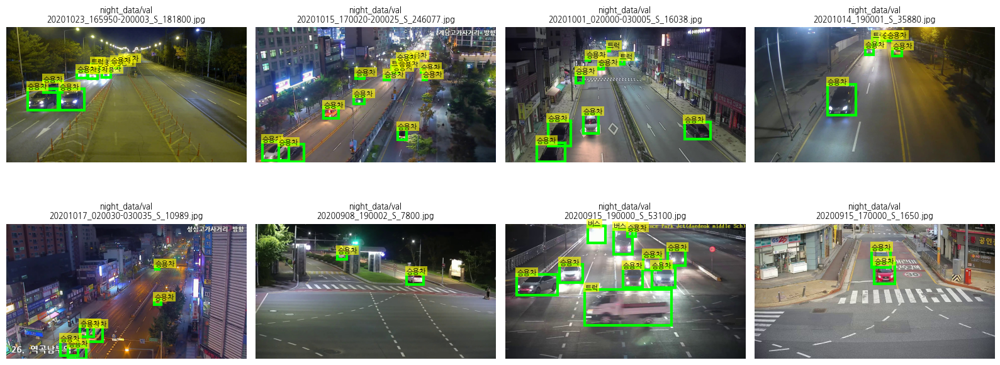

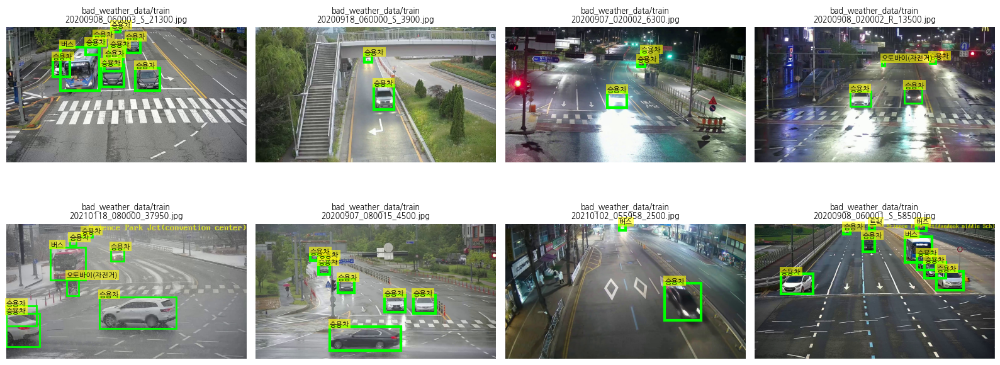

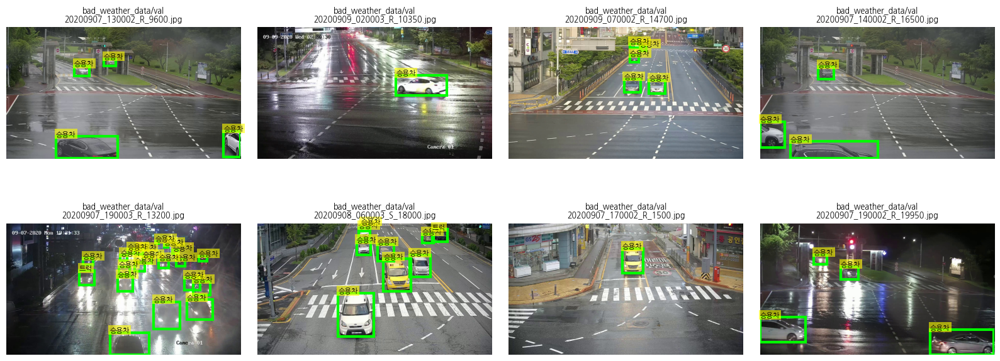

In [10]:
# 셀 3) 사용 예시
OUT_ROOT: Path = Path("yolo_transfer_cls_5") # 경로 변경 할것!

# 스테이지별 data.yaml에서 클래스 이름을 읽는다
day_names: List[str] = load_class_names(OUT_ROOT / "day_data" / "data.yaml")
night_names: List[str] = load_class_names(OUT_ROOT / "night_data" / "data.yaml")
badw_names: List[str] = load_class_names(OUT_ROOT / "bad_weather_data" / "data.yaml")

# 시각화 호출 예시 -> 필요에 따라 stage, subset, max_samples 조정
visualize_samples(stage="day_data", subset="train", out_root=OUT_ROOT, class_names=day_names, max_samples=8, cols=4)
visualize_samples(stage="day_data", subset="val",   out_root=OUT_ROOT, class_names=day_names, max_samples=8, cols=4)

visualize_samples(stage="night_data", subset="train", out_root=OUT_ROOT, class_names=night_names, max_samples=8, cols=4)
visualize_samples(stage="night_data", subset="val",   out_root=OUT_ROOT, class_names=night_names, max_samples=8, cols=4)

visualize_samples(stage="bad_weather_data", subset="train", out_root=OUT_ROOT, class_names=badw_names, max_samples=8, cols=4)
visualize_samples(stage="bad_weather_data", subset="val",   out_root=OUT_ROOT, class_names=badw_names, max_samples=8, cols=4)
